<a href="https://colab.research.google.com/github/igres9014/TFG_ETSEIB_SergiSelles_2021/blob/main/MaskRCNN_LLAGOSTES_cap_amunt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MaskRCNN LLAGOSTES


## Install Matterport Mask-RCNN in Google Colab

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
#%cd /gdrive/My Drive/ETSEIB_TFG/Unet_Pytorch/Data/

Mounted at /gdrive


In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
!pip3 uninstall -y keras
!pip3 install keras==2.1.0

Uninstalling Keras-2.3.1:
  Successfully uninstalled Keras-2.3.1
     |████████████████████████████████| 307kB 20.8MB/s 
ERROR: textgenrnn 1.4.1 has requirement keras>=2.1.5, but you'll have keras 2.1.0 which is incompatible.
  Found existing installation: Keras 2.4.3
    Uninstalling Keras-2.4.3:
      Successfully uninstalled Keras-2.4.3


In [ ]:
!git clone https://github.com/matterport/Mask_RCNN
%cd Mask_RCNN
!pip3 install -r requirements.txt
!python3 setup.py install

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 40.01 MiB/s, done.
Resolving deltas: 100% (562/562), done.
/content/Mask_RCNN
     |████████████████████████████████| 163kB 26.4MB/s 
     |████████████████████████████████| 204kB 46.1MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7540 sha256=bb21a92f209802e8c8157f0fd65ad3e7ec6ca5446b1e2ba18d2adac6f093a192
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:645: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore

In [ ]:
!git clone https://github.com/cocodataset/cocoapi.git
%cd cocoapi/PythonAPI
!make
%cd ../../

Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 33.63 MiB/s, done.
Resolving deltas: 100% (576/576), done.
/content/Mask_RCNN/cocoapi/PythonAPI
python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/Mask_RCNN/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fdebug-prefix-map=/build/python3.7-a56wZI/python3.7-3.

## Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import json

# Root directory of the project
#os.path es una llist i per tant podem fer .append 
ROOT_DIR = os.path.abspath("/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/experiment_0")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(os.path.join(os.path.abspath("../"),"mask_rcnn_coco.h5"))

Using TensorFlow backend.


In [ ]:
FISH_NAME = 'cap_amunt'

FISH_DATA = 'LLAGOSTES_cap_amunt'

In [ ]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
CollaboracioCientificsPescadors_DATA_DIR = '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/'

DATASET_DIR = os.path.join(CollaboracioCientificsPescadors_DATA_DIR,FISH_DATA)


DATASET_TRAIN_DIR = os.path.join(DATASET_DIR, 'LabelMe_JSON/train')
DATASET_VAL_DIR = os.path.join(DATASET_DIR, 'LabelMe_JSON/val')
DATASET_TEST_DIR = os.path.join(DATASET_DIR, 'LabelMe_JSON/test')

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

## Configurations

In [ ]:
class LLAGOSTES_cap_amunt(Config):
    """Configuration for training on the Raps  dataset.
    Derives from the base Config class and overrides some values.
    """
    # Give the configuration a recognizable name
    NAME = "LLAGOSTES_cap_amunt"

    # We use a GPU with 11GB memory, which can fit ONE image.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1 # Background + cap_amunt !!

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 100 # The same number of pictures in the trainin set 

    # Skip detections <  confidence
    DETECTION_MIN_CONFIDENCE = 0.9

    # MiniMask
    USE_MINI_MASK = True

    IMAGE_SHAPE = [1024,1024,3]

	




config = LLAGOSTES_cap_amunt()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Dataset

In [ ]:
from PIL import Image,ImageDraw

In [ ]:
axis_Width = 15

In [ ]:
class LLAGOSTES_cap_amuntDataset(utils.Dataset):
    def load_dataset(self, dataset_dir):
        self.add_class('dataset', 1, 'cap_amunt')
        # find all images
        for i, filename in enumerate(os.listdir(dataset_dir)):
            annotation_file = os.path.join(dataset_dir, filename.replace('.jpg', '.json'))
            if '.jpg' in filename and os.path.isfile(annotation_file):
                    self.add_image('dataset', 
                               image_id=i, 
                               path=os.path.join(dataset_dir, filename), 
                               annotation=annotation_file)
    
    def extract_masks(self, filename):
        json_file = os.path.join(filename)
        with open(json_file) as f:
            img_anns = json.load(f)
        
        n_masks = 0
        for anno in img_anns['shapes']:
            if anno['label']=='cap_amunt':
                n_masks+=1
            
        masks = np.zeros([img_anns['imageHeight'], img_anns['imageWidth'], n_masks], dtype='uint8')
        classes = []
        i=0
        for anno in img_anns['shapes']:
            if anno['label']=='cap_amunt':
                if anno['shape_type']=='polygon':
                  mask = np.zeros([img_anns['imageHeight'], img_anns['imageWidth']], dtype=np.uint8)            
                  cv2.fillPoly(mask, np.array([anno['points']], dtype=np.int32), 1)
                  masks[:, :, i] = mask
                  classes.append(self.class_names.index(anno['label']))
                  i+=1
                elif anno['shape_type']=="linestrip":
                  mask = np.zeros([img_anns['imageHeight'], img_anns['imageWidth']], dtype=np.uint8)
                  mask = Image.fromarray(mask)
                  draw = ImageDraw.Draw(mask)
                  xy = [tuple(i) for i in anno['points']]
                  skeleton = xy
                  draw.line(xy=skeleton, fill='white', width = axis_Width, joint='curve')
                  masks[:, :, i] = mask
                  classes.append(self.class_names.index(anno['label']))
                  i+=1
        return masks, classes
 
    # load the masks for an image
    def load_mask(self, image_id):
        # get details of image
        info = self.image_info[image_id]
        # define box file location
        path = info['annotation']
        # load masks
        masks, classes = self.extract_masks(path)
        return masks, np.asarray(classes, dtype='int32')
    
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

In [ ]:
# Create data sets
# train set
dataset_train = LLAGOSTES_cap_amuntDataset()
dataset_train.load_dataset(DATASET_TRAIN_DIR)
dataset_train.prepare()

print("Image Count: {}".format(len(dataset_train.image_ids)))
print("Class Count: {}".format(dataset_train.num_classes))
for i, info in enumerate(dataset_train.class_info):
    print("{:3}. {:50}".format(i, info['name']))

 
# val set
dataset_val = LLAGOSTES_cap_amuntDataset()
dataset_val.load_dataset(DATASET_VAL_DIR)
dataset_val.prepare()

print("Image Count: {}".format(len(dataset_val.image_ids)))
print("Class Count: {}".format(dataset_val.num_classes))
for i, info in enumerate(dataset_val.class_info):
    print("{:3}. {:50}".format(i, info['name']))

# test set
dataset_test = LLAGOSTES_cap_amuntDataset()
dataset_test.load_dataset(DATASET_TEST_DIR)
dataset_test.prepare()
print('Test: %d images' % len(dataset_test.image_ids))

print("Image Count: {}".format(len(dataset_test.image_ids)))
print("Class Count: {}".format(dataset_test.num_classes))
for i, info in enumerate(dataset_test.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 83
Class Count: 2
  0. BG                                                
  1. cap_amunt                                         
Image Count: 10
Class Count: 2
  0. BG                                                
  1. cap_amunt                                         
Test: 10 images
Image Count: 10
Class Count: 2
  0. BG                                                
  1. cap_amunt                                         


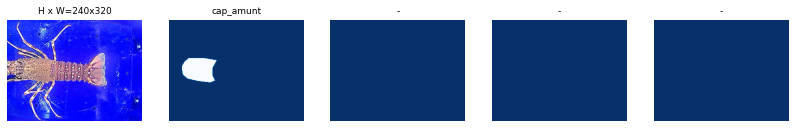

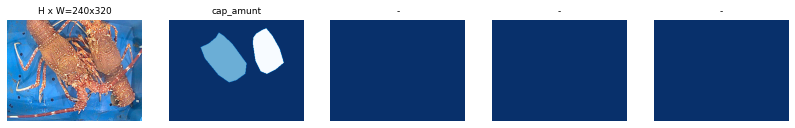

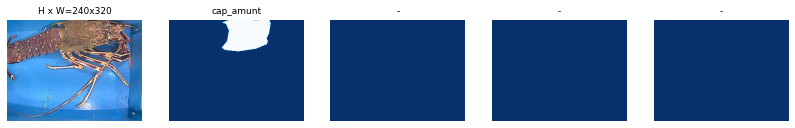

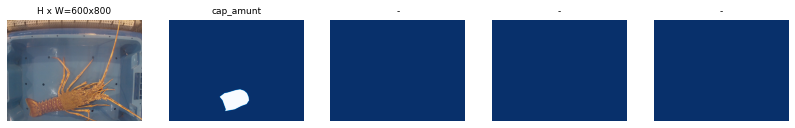

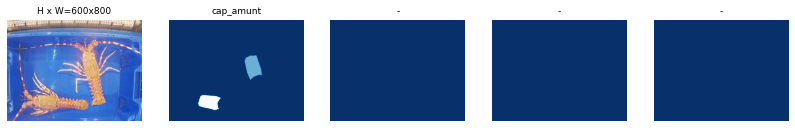

In [ ]:
image_ids = np.random.choice(dataset_train.image_ids, 5)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

## Create Model

In [ ]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config, model_dir=MODEL_DIR)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead


In [ ]:
# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

## Training

In [ ]:
import imgaug 

In [ ]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
LLAGOSTES_augmentation = imgaug.augmenters.Sometimes(0.5,
    [imgaug.augmenters.geometric.Affine(rotate=(-360,360))])
    
    
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=50, 
            layers='heads',augmentation = LLAGOSTES_augmentation)


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/experiment_0/logs/llagostes_cap_amunt20210422T0700/mask_rcnn_llagostes_cap_amunt_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_

/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "



Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor






/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2039: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/50


ERROR:root:Error processing image {'id': 67, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30166_388.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30166_388.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


  5/100 [>.............................] - ETA: 5:17 - loss: 3.8916 - rpn_class_loss: 0.0230 - rpn_bbox_loss: 1.2458 - mrcnn_class_loss: 0.5195 - mrcnn_bbox_loss: 0.9697 - mrcnn_mask_loss: 1.1336

ERROR:root:Error processing image {'id': 9, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30611_1443.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30611_1443.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size
ERROR:root:Error processing image {'id': 9, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30611_1443.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30611_1443.json'}
Traceback (most recent call last):
  File "/c

 30/100 [========>.....................] - ETA: 1:07 - loss: 2.9655 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 1.3615 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.6872 - mrcnn_mask_loss: 0.7261

ERROR:root:Error processing image {'id': 70, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/21217_2765.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/21217_2765.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


 39/100 [==========>...................] - ETA: 52s - loss: 2.7305 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 1.1601 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.6898 - mrcnn_mask_loss: 0.6941

ERROR:root:Error processing image {'id': 72, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/20183_426.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/20183_426.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


 45/100 [============>.................] - ETA: 44s - loss: 2.5831 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 1.0538 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.6727 - mrcnn_mask_loss: 0.6786

ERROR:root:Error processing image {'id': 11, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30632_1489.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30632_1489.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


 69/100 [===================>..........] - ETA: 21s - loss: 2.2747 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.8600 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.6610 - mrcnn_mask_loss: 0.6113

ERROR:root:Error processing image {'id': 11, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30632_1489.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30632_1489.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


 75/100 [=====================>........] - ETA: 17s - loss: 2.2168 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.8141 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.6688 - mrcnn_mask_loss: 0.5976

ERROR:root:Error processing image {'id': 15, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30478_1150.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30478_1150.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


 99/100 [============================>.] - ETA: 0s - loss: 1.9712 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.6821 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.6221 - mrcnn_mask_loss: 0.5494

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2197: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'
ERROR:root:Error processing image {'id': 15, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30478_1150.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30478_1150.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size



100/100 [==============================] - 109s 1s/step - loss: 1.9682 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.6783 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.6240 - mrcnn_mask_loss: 0.5485 - val_loss: 1.2224 - val_rpn_class_loss: 0.0239 - val_rpn_bbox_loss: 0.3412 - val_mrcnn_class_loss: 0.0355 - val_mrcnn_bbox_loss: 0.4693 - val_mrcnn_mask_loss: 0.3526
Epoch 2/50
 10/100 [==>...........................] - ETA: 44s - loss: 1.4999 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.6692 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.4477 - mrcnn_mask_loss: 0.2977

ERROR:root:Error processing image {'id': 9, 'source': 'dataset', 'path': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30611_1443.jpg', 'annotation': '/content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/LabelMe_JSON/train/30611_1443.json'}
Traceback (most recent call last):
  File "/content/Mask_RCNN/mrcnn/model.py", line 1709, in data_generator
    use_mini_mask=config.USE_MINI_MASK)
  File "/content/Mask_RCNN/mrcnn/model.py", line 1257, in load_image_gt
    assert mask.shape == mask_shape, "Augmentation shouldn't change mask size"
AssertionError: Augmentation shouldn't change mask size


 11/100 [==>...........................] - ETA: 44s - loss: 1.4617 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.6244 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.4580 - mrcnn_mask_loss: 0.2977

StopIteration: ignored

In [ ]:
# Fine tune all layers
# Passing layers="all" trains all layers. You can also 
# pass a regular expression to select which layers to
# train by name pattern.
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE / 10,
            epochs=100, 
            layers="all")


Starting at epoch 0. LR=0.0001

Checkpoint Path: /content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/experiment_0/logs/llagostes_cap_amunt20210422T0700/mask_rcnn_llagostes_cap_amunt_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a        

/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/tensorflow-1.15.2/python3.7/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2039: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers 

Epoch 1/100
 99/100 [============================>.] - ETA: 1s - loss: 0.9235 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.2466 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.3110 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2197: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


100/100 [==============================] - 130s 1s/step - loss: 0.9232 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.3122 - mrcnn_mask_loss: 0.3091 - val_loss: 1.0013 - val_rpn_class_loss: 0.0221 - val_rpn_bbox_loss: 0.3193 - val_mrcnn_class_loss: 0.0240 - val_mrcnn_bbox_loss: 0.3452 - val_mrcnn_mask_loss: 0.2907
Epoch 2/100
100/100 [==============================] - 101s 1s/step - loss: 0.6711 - rpn_class_loss: 0.0129 - rpn_bbox_loss: 0.1586 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.2163 - mrcnn_mask_loss: 0.2568 - val_loss: 0.9104 - val_rpn_class_loss: 0.0207 - val_rpn_bbox_loss: 0.2770 - val_mrcnn_class_loss: 0.0213 - val_mrcnn_bbox_loss: 0.3303 - val_mrcnn_mask_loss: 0.2611
Epoch 3/100
100/100 [==============================] - 102s 1s/step - loss: 0.5335 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.2304 - val_loss: 0.8254 - val_rpn_class_loss: 0.01

## Detection

In [ ]:
class InferenceConfig(LLAGOSTES_cap_amunt):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.
Loading weights from  /content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/experiment_0/logs/llagostes_cap_amunt20210422T0700/mask_rcnn_llagostes_cap_amunt_0100.h5




Re-starting from epoch 100


In [ ]:
inference_config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:   82.00000  max:  676.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8


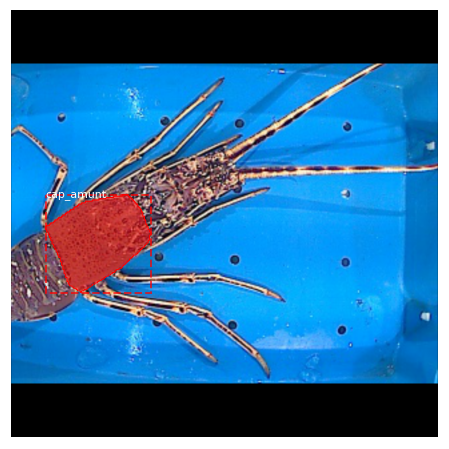

-34.44373953058516


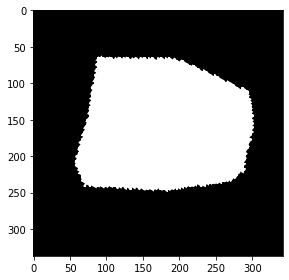

233


In [ ]:
# Test on a random image
image_id = random.choice(dataset_val.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

from sklearn import decomposition
import skimage
from skimage.transform import resize
from skimage import io

def mask_length(mask):
  mask = gt_mask.reshape(1024,1024)
  x1, y1, x2, y2 = gt_bbox[0,0], gt_bbox[0,1], gt_bbox[0,2], gt_bbox[0,3]
  mask = mask[x1:x2,y1:y2]
  coord = np.argwhere(mask>0)
  mean = np.mean(coord, axis=0)
  pca = decomposition.PCA(n_components=2)
  pca.fit(coord)
  angle = math.atan(pca.components_[0, 0]/pca.components_[0, 1])
  deg = math.degrees(angle)
  print(deg)
  mask_r = skimage.transform.rotate(mask, deg, resize=True, center=mean, preserve_range=True)
  io.imshow(mask_r)
  io.show()
  coord2 = np.argwhere(mask_r>0)
  mean2 = np.mean(coord2, axis=0)
  mean2 = mean2.astype(int)
  vector = mask_r[mean2[0],:]
  vector = np.argwhere(vector>0)
  result = vector.shape[0]
  print(result)

mask_length(gt_mask)


Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32



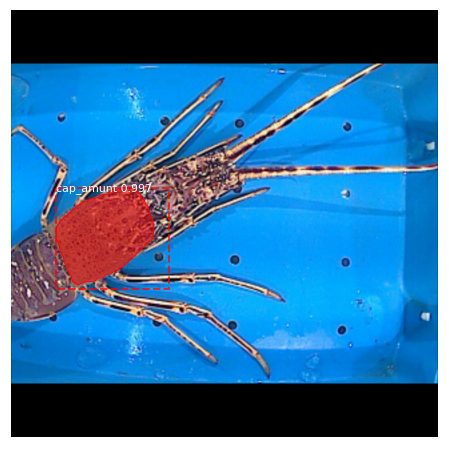

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'], ax=get_ax())

In [ ]:
# !!!!!?????
# Test on a random image
#image_id = random.choice(dataset_val.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

from sklearn import decomposition
import skimage
from skimage.transform import resize
from skimage import io

def mask_length(mask):
  mask = gt_mask.reshape(1024,1024)
  x1, y1, x2, y2 = gt_bbox[0,0], gt_bbox[0,1], gt_bbox[0,2], gt_bbox[0,3]
  mask = mask[x1:x2,y1:y2]
  coord = np.argwhere(mask>0)
  mean = np.mean(coord, axis=0)
  pca = decomposition.PCA(n_components=2)
  pca.fit(coord)
  angle = math.atan(pca.components_[0, 0]/pca.components_[0, 1])
  deg = math.degrees(angle)
  print(deg)
  mask_r = skimage.transform.rotate(mask, deg, resize=True, center=mean, preserve_range=True)
  io.imshow(mask_r)
  io.show()
  coord2 = np.argwhere(mask_r>0)
  mean2 = np.mean(coord2, axis=0)
  mean2 = mean2.astype(int)
  vector = mask_r[mean2[0],:]
  vector = np.argwhere(vector>0)
  result = vector.shape[0]
  print(result)

mask_length(gt_mask)

## Evaluation

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
image_ids = dataset_val.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data    
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  1.0


In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data    
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.9


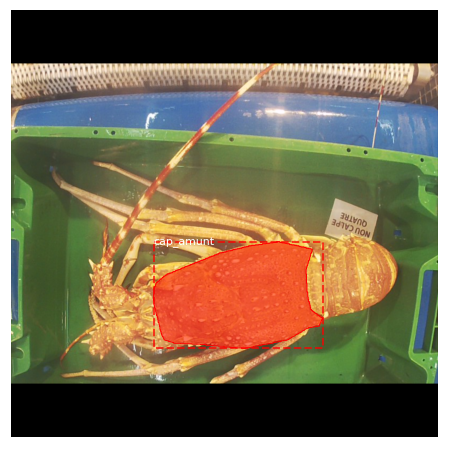

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


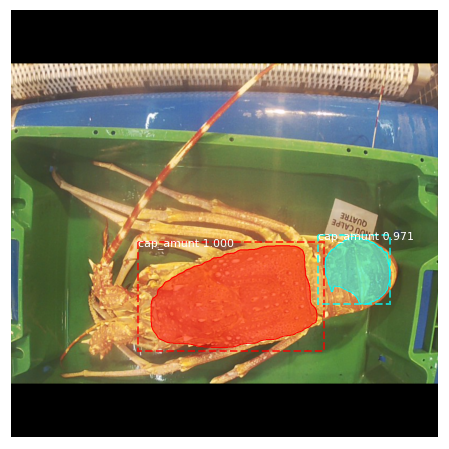

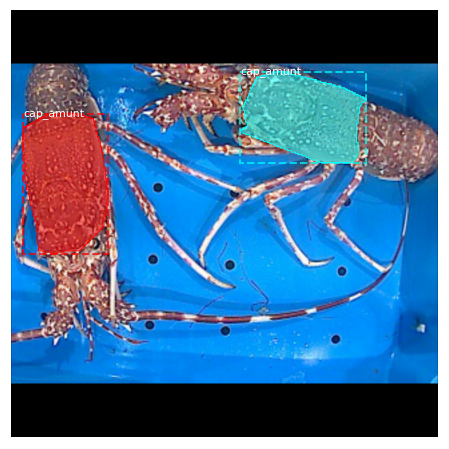

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


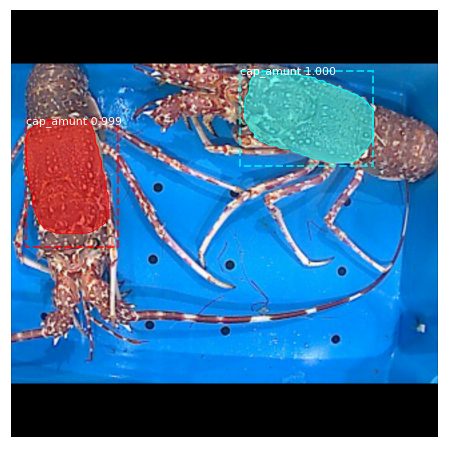

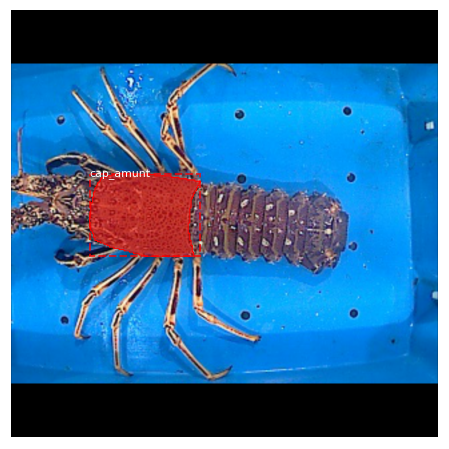

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


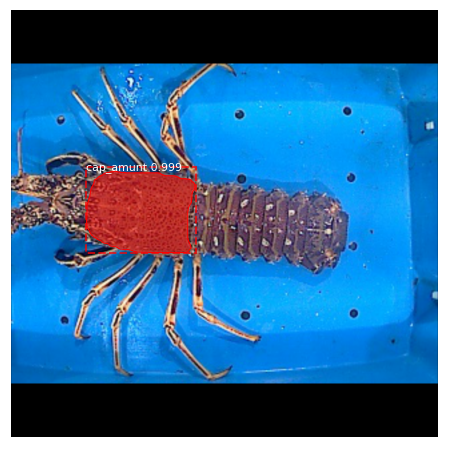

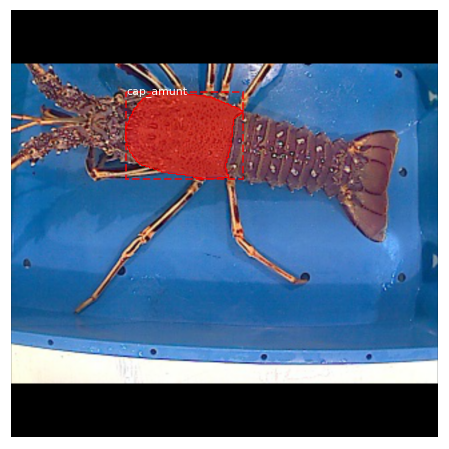

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


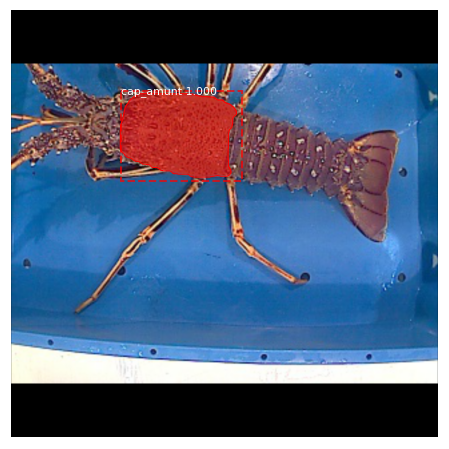

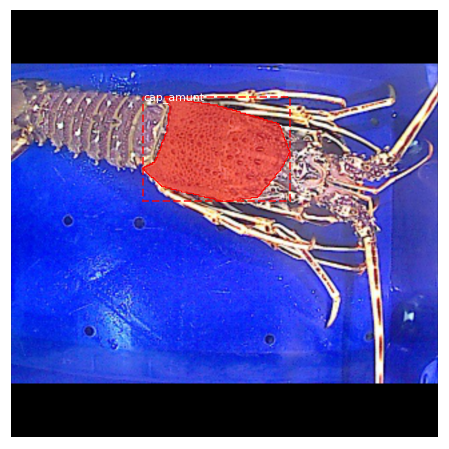

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


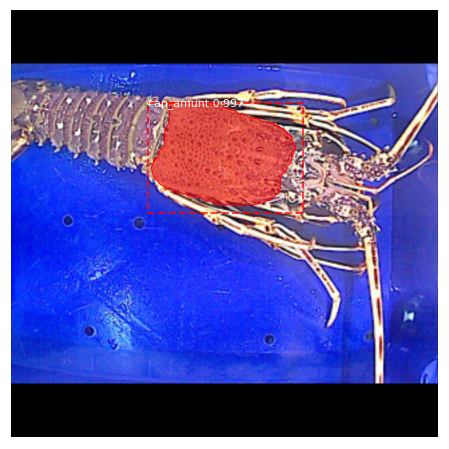

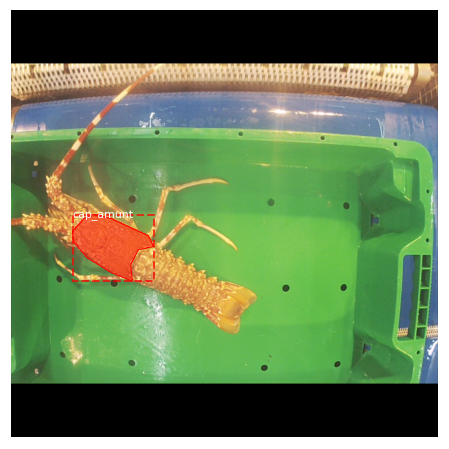

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32

*** No instances to display *** 



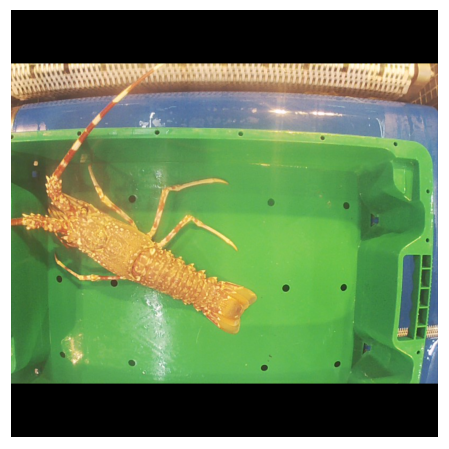

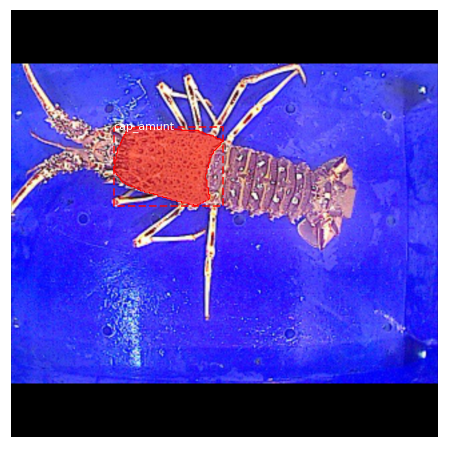

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


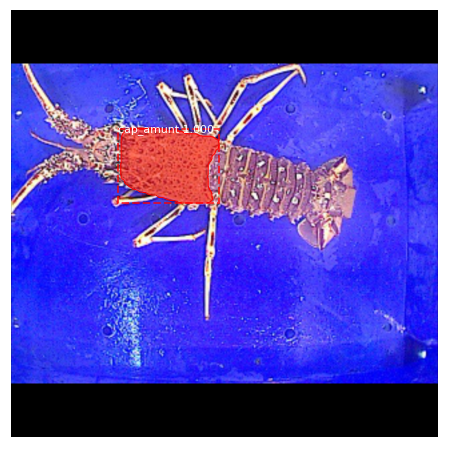

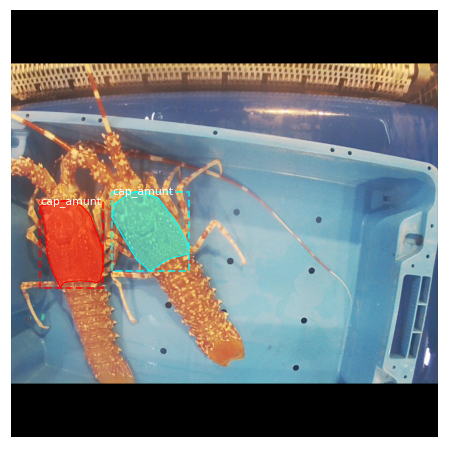

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


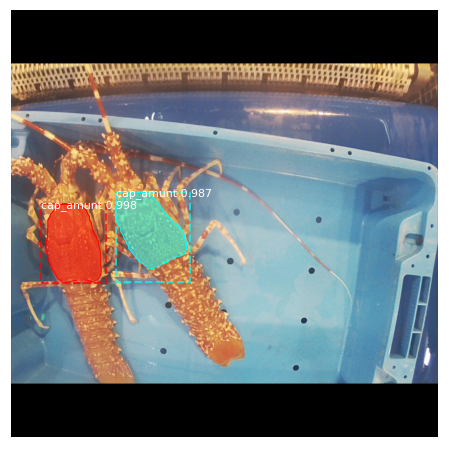

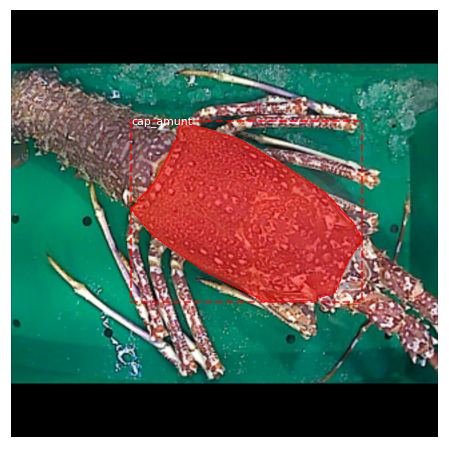

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


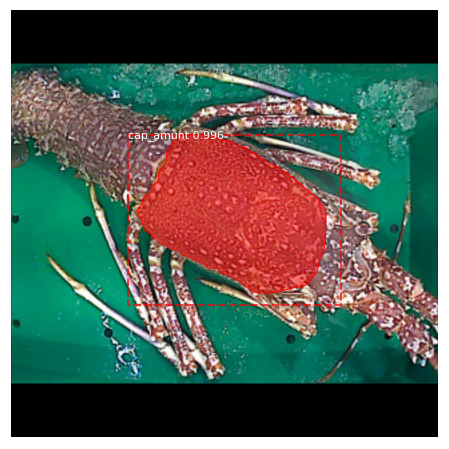

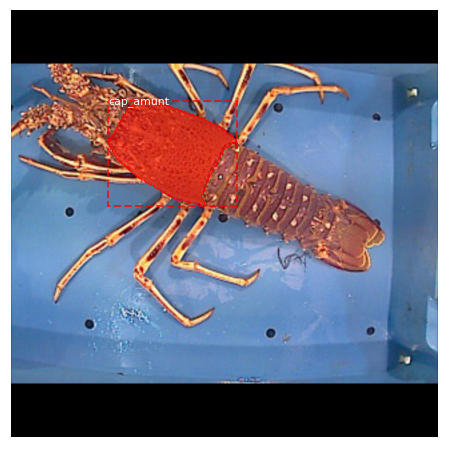

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


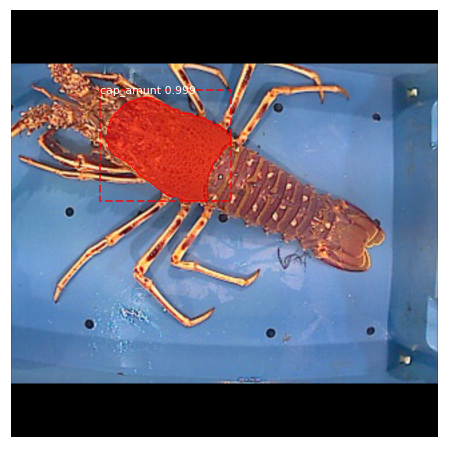

In [ ]:
# Test on a set of images

#image_ids = dataset_val.image_ids

image_ids = dataset_test.image_ids


for image_id in image_ids:
    # Load image and ground truth data CANVIAR DATASET_VAL PER Dataset_TEST
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config, 
                           image_id, use_mini_mask=False)
        
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_test.class_names, figsize=(8, 8))

    results = model.detect([original_image], verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

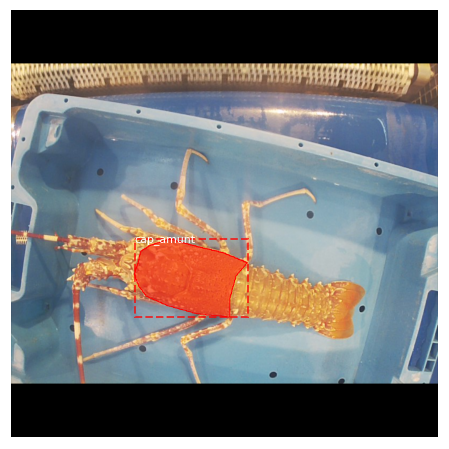

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


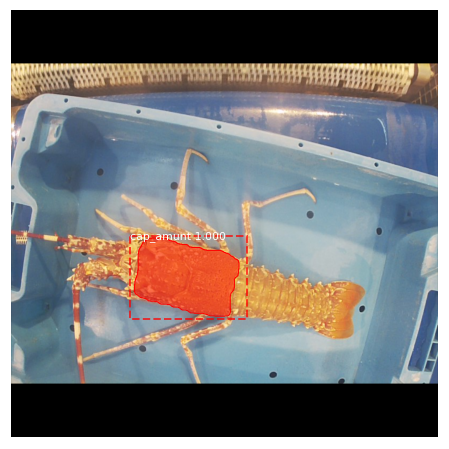

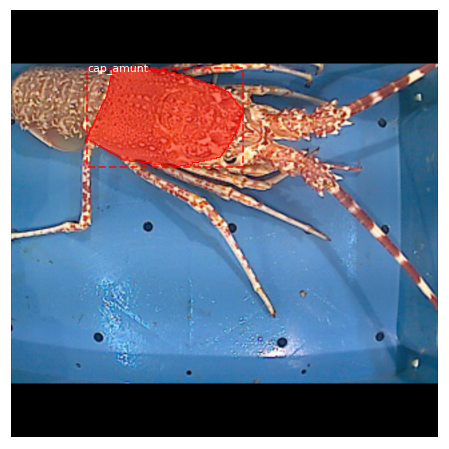

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


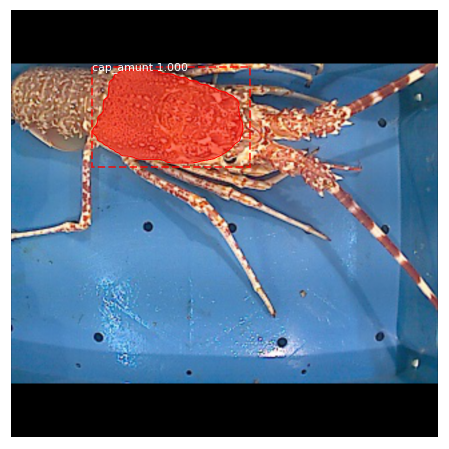

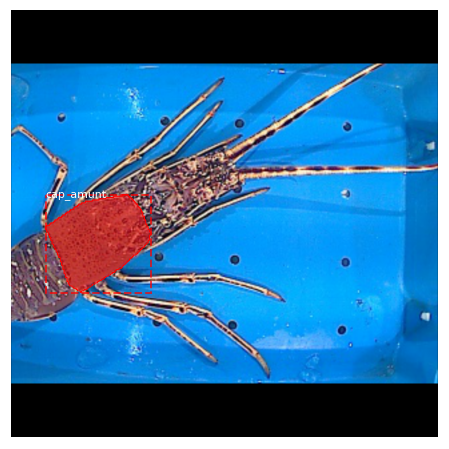

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


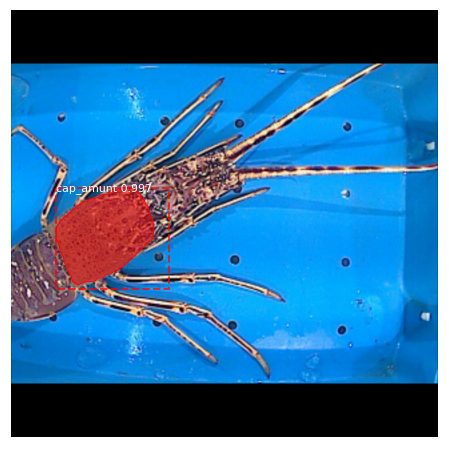

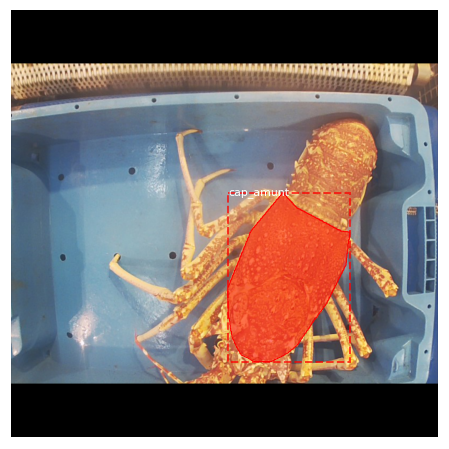

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


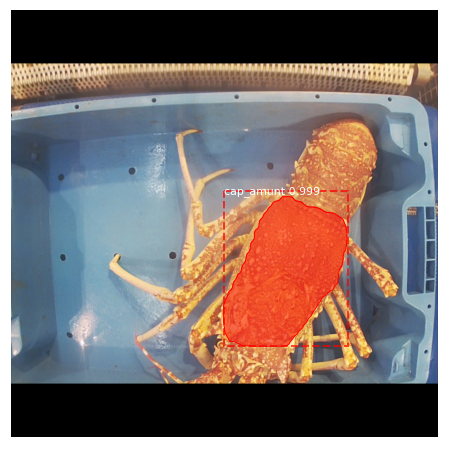

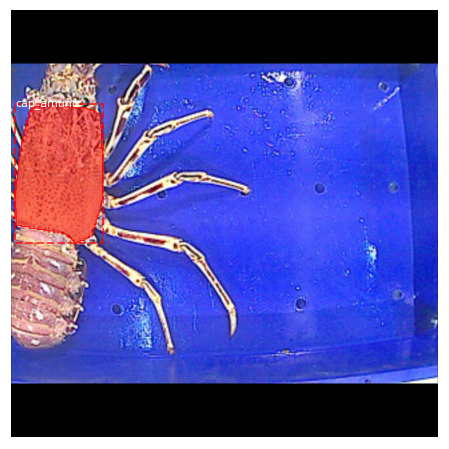

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


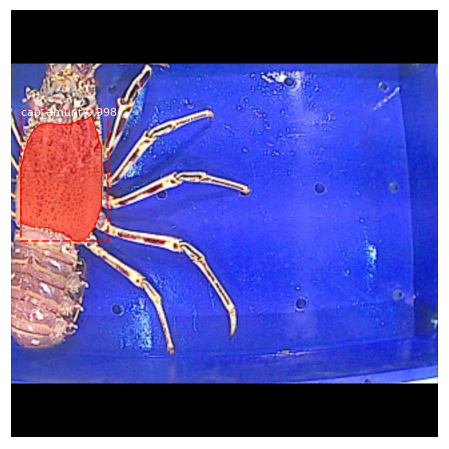

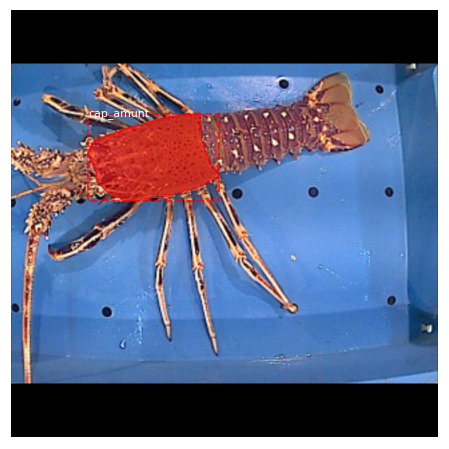

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


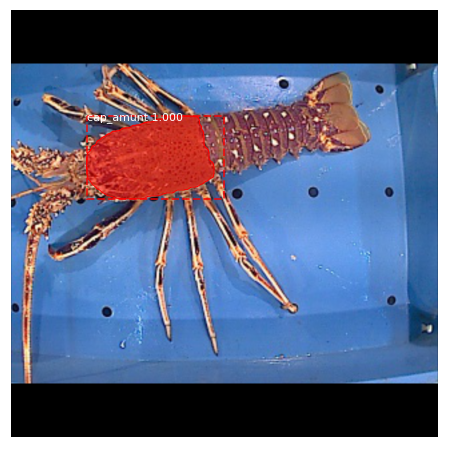

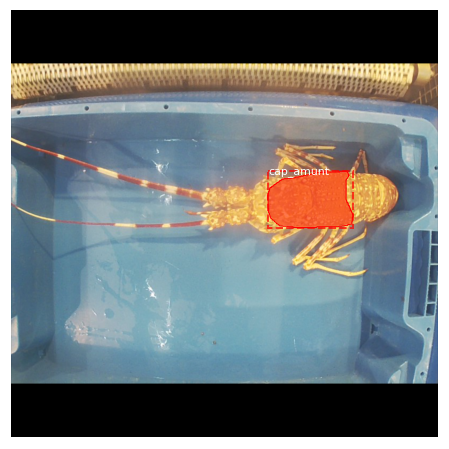

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


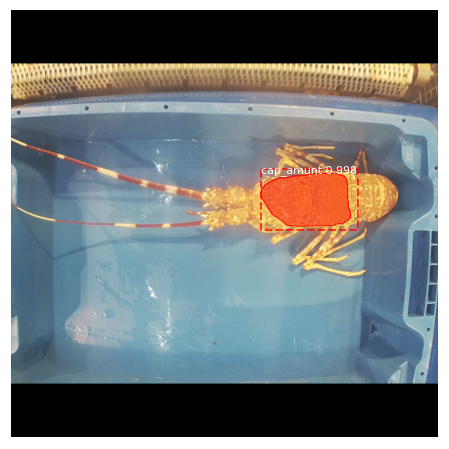

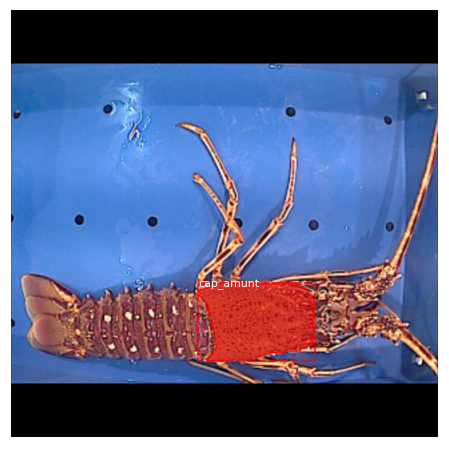

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


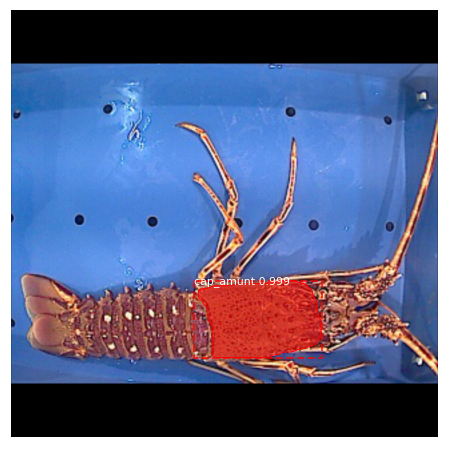

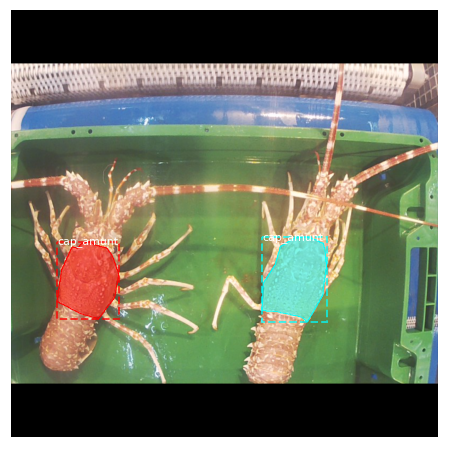

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


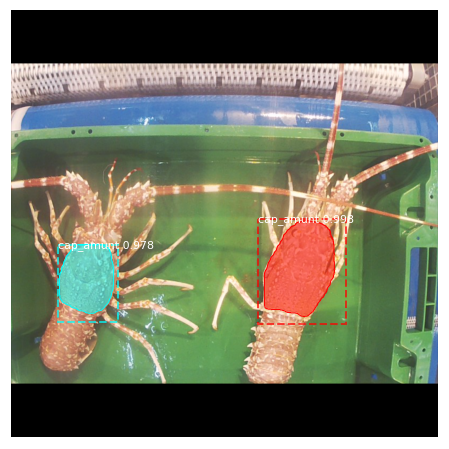

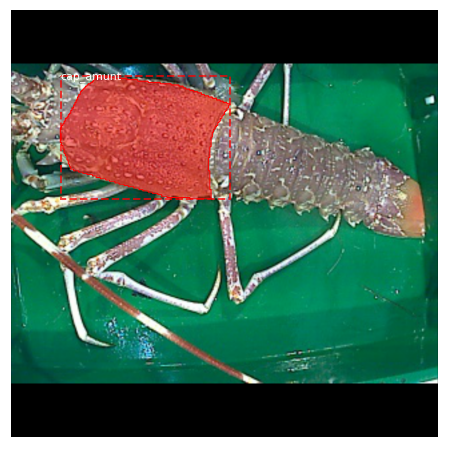

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


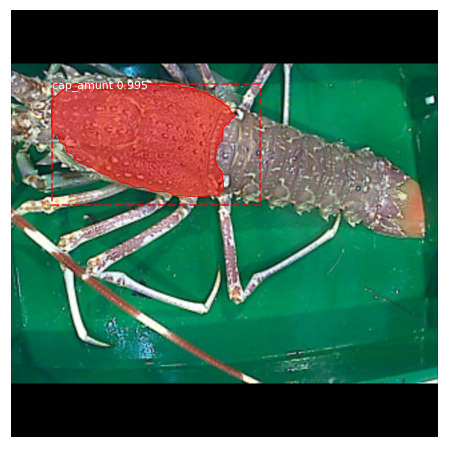

In [ ]:
# Test on a set of images

image_ids = dataset_val.image_ids

#image_ids = dataset_test.image_ids


for image_id in image_ids:
    # Load image and ground truth data CANVIAR DATASET_VAL PER Dataset_TEST
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)
        
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_val.class_names, figsize=(8, 8))

    results = model.detect([original_image], verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'], ax=get_ax())

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/ETSEIB_TFG/Mask_RCNN/Data/LLAGOSTES_cap_amunt/experiment_0/logs